In [1]:
from collections import defaultdict
import seaborn as sns
import matplotlib.pyplot as plt

from extract_latest_data import *
from util import *

### Plot sidewalk coverage of entire city

Load data

In [6]:
city = 'nyc'
boundaries = gpd.read_file('data/boundaries/%s.geojson'%(city))
# if(city == 'nyc'): 
#     boundaries = boundaries[2:4] # To only Filter by brookyln & Manhattan

l = LatestHandler()
l.read_parsed_data(city)

sidewalk = l.filter_data(sidewalk_qualifier)
sidewalk = l.get_gdf(sidewalk)
if(city == 'nyc'): sidewalk = sidewalk.cx[-74.04 : -73.85, 40.55 : 40.90]
else: sidewalk = gpd.sjoin(sidewalk, boundaries, predicate = 'intersects')

# w_sidewalk = l.filter_data(highway_with_sidewalk)
# w_sidewalk = l.get_gdf(w_sidewalk)

# wo_sidewalk = l.filter_data(highway_without_sidewalk)
# wo_sidewalk = l.get_gdf(wo_sidewalk)

w_sidewalk_tag = l.filter_data(highway_with_sidewalk_tag)
w_sidewalk_tag = l.get_gdf(w_sidewalk_tag)
if(city == 'nyc'): w_sidewalk_tag = w_sidewalk_tag.cx[-74.04 : -73.85, 40.55 : 40.90]
else: w_sidewalk_tag = gpd.sjoin(w_sidewalk_tag, boundaries, predicate = 'intersects')

wo_sidewalk_tag = l.filter_data(highway_without_sidewalk_tag)
wo_sidewalk_tag = l.get_gdf(wo_sidewalk_tag)
if(city == 'nyc'): wo_sidewalk_tag = wo_sidewalk_tag.cx[-74.04 : -73.85, 40.55 : 40.90]
else: wo_sidewalk_tag = gpd.sjoin(wo_sidewalk_tag, boundaries, predicate = 'intersects')


footway = l.filter_data(footway_qualifier)
footway = l.get_gdf(footway)
if(city == 'nyc'): footway = footway.cx[-74.04 : -73.85, 40.55 : 40.90]
else: footway = gpd.sjoin(footway, boundaries, predicate = 'intersects')


# crossing = l.filter_data(highway_crossing_qualifier)
# crossing = l.get_gdf(crossing)

Plot & save figure

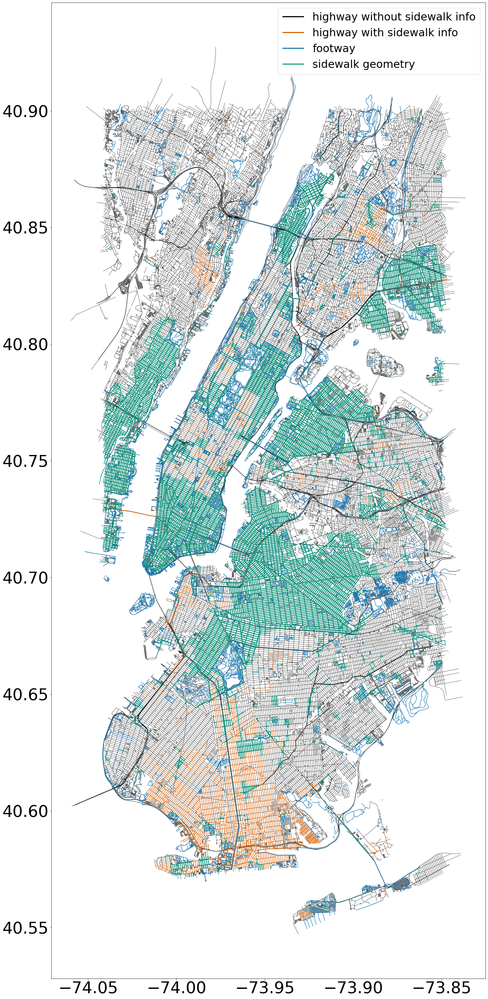

In [7]:
plt.rc('legend',fontsize=30)

fig, ax = plt.subplots(figsize=(50,50)) 
wo_sidewalk_tag.plot(color = 'black', lw=0.6, ax=ax, label = 'highway without sidewalk info')
w_sidewalk_tag.plot(color = '#d95f02', lw=1.2, ax=ax, label = 'highway with sidewalk info')
# w_sidewalk.plot(color = '#d95f02', lw=1.5, ax=ax, label = 'highway with sidewalk')
# wo_sidewalk.plot(color = '#e7298a', lw=1.5, ax=ax, label = 'highway without sidewalk')
footway.plot(color = '#1f78b4', lw=1.2, ax=ax, label = 'footway')
sidewalk.plot(color = '#1b9e77', lw=1.1, ax=ax, label = 'sidewalk geometry')

# get the legend object
leg = ax.legend()
# change the line width for the legend
for line in leg.get_lines():
    line.set_linewidth(3.0)

plt.xticks(fontsize = 45)
plt.yticks(fontsize = 45)
plt.savefig('data/plots/Fig3/%s_entire_map.png'%(city), dpi=600)

In [ ]:
# Check stats for smaller neighborhoods!!
# Chicago uptown: 

### Explore sidewalk and sidewalk tags using folium map

In [29]:
sidewalk['ts'] = sidewalk['ts'].astype(str)
sidewalk.explore()

### Count **sources** of sidewalk

In [22]:
def count_source(cnt, tag):
    if('source' in tag):
        cnt[tag.get('source')] += 1

cnt = defaultdict(lambda: 0)
sidewalk.apply(lambda row: 
                count_source(
                    cnt,
                    row.tags
                ),
                axis = 1)

print('Source: ' 'Count\n')
for key in cnt: print("%s: %d"%(key, cnt[key]))

Source: Count

survey: 5
yahoo_wms: 1
yahoo_wms;knowledge: 6
knowledge: 5
Bing: 13
USGS Large Scale Imagery: 1
bing: 4
survey, imagery: 5
Local Knwoladge: 2
maxar: 67
knowledge;yahoo_wms: 2


### Plot sidewalk attribute tag percentage

Extract tag pert of attributes

In [3]:
def get_sidewalk_attribute_perct(city, res):
    l = LatestHandler()
    l.read_parsed_data(city)

    sidewalk = l.filter_data(sidewalk_qualifier)
    sidewalk = l.get_gdf(sidewalk)

    att = ['surface', 'smoothness', 'width', 'bicycle', 'incline', 'kerb', 'wheelchair', 'tactile_paving']
    mp = defaultdict(lambda: 0)

    for tag in sidewalk['tags'].tolist():
        for key in tag:
            if(key in att):
                mp[key] += 1

    for key in att:
        res.append([city, key, (mp[key]/len(sidewalk) * 100)])

cities = ['sea', 'chi', 'nyc']
res = []

for city in cities:
    get_sidewalk_attribute_perct(city, res)

city_res = pd.DataFrame(res, columns = ['city', 'attribute', 'percentage'])
city_res["city"].replace({"sea": "Seattle", "chi": "Chicago", "nyc": "New York City"}, inplace=True)

plot

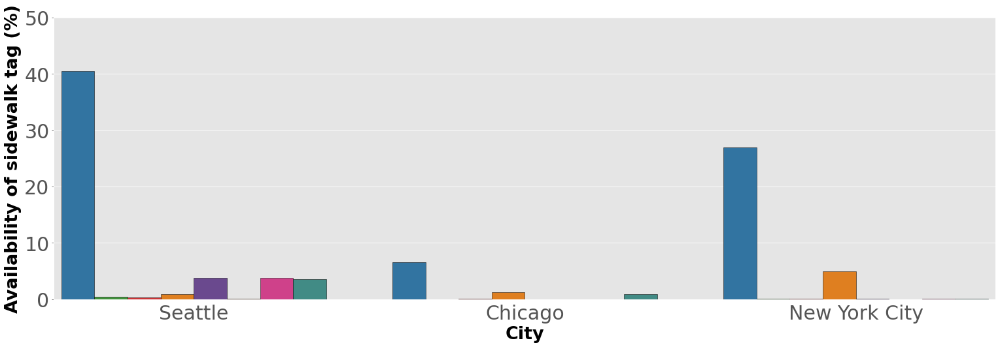

In [4]:
plt.style.use('ggplot')

plt.figure(figsize=(20, 6))
plt.xticks(fontsize='30')
plt.yticks(fontsize='30') 

clrs = ['#1f78b4', '#33a02c', '#e31a1c', '#ff7f00', '#6a3d9a', '#b15928', '#e7298a', '#35978f']
ax = sns.barplot(x="city", y="percentage", hue="attribute", data=city_res, palette=clrs, edgecolor = 'black')

# plt.setp(ax.patches, linewidth=0.7)

leg = ax.legend()
leg.get_frame().set_linewidth(0.0)
plt.setp(ax.get_legend().get_texts(), fontsize='25')
plt.setp(ax.get_legend().get_title(), fontsize='25')
plt.legend([],[], frameon=False)

plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0.008,0.008)


plt.xlabel('City', fontweight='bold', color = '#000', fontsize='27')
plt.ylabel('Availability of sidewalk tag (%)', fontweight='bold', color = '#000', fontsize='27');
ax.set_ylim([0, 50])

ax.spines.right.set_visible(False)
ax.spines.top.set_visible(False)

ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

plt.tick_params(bottom = False)
plt.savefig("data/plots/Fig4/bars.pdf", format="pdf", bbox_inches="tight")

In [13]:
city_res

,city,attribute,percentage
0,Seattle,surface,40.487219
1,Seattle,smoothness,0.423171
2,Seattle,width,0.325956
3,Seattle,bicycle,0.943558
4,Seattle,incline,3.831418
5,Seattle,kerb,0.068622
6,Seattle,wheelchair,3.751358
7,Seattle,tactile_paving,3.534054
8,Chicago,surface,6.603019
9,Chicago,smoothness,0.011434


In [11]:
city_res[city_res['city'] == 'Chicago']

,city,attribute,percentage
8,Chicago,surface,6.603019
9,Chicago,smoothness,0.011434
10,Chicago,width,0.040018
11,Chicago,bicycle,1.252001
12,Chicago,incline,0.017151
13,Chicago,kerb,0.005717
14,Chicago,wheelchair,0.034301
15,Chicago,tactile_paving,0.868969


In [12]:
city_res[city_res['city'] == 'Seattle']

,city,attribute,percentage
0,Seattle,surface,40.487219
1,Seattle,smoothness,0.423171
2,Seattle,width,0.325956
3,Seattle,bicycle,0.943558
4,Seattle,incline,3.831418
5,Seattle,kerb,0.068622
6,Seattle,wheelchair,3.751358
7,Seattle,tactile_paving,3.534054


In [ ]:
0.002 - 0.06